<h1 style="font-size:2.5rem; color:green;"> Taylor diagram for pattern correlation of monthly values of spatial means of snow cover from different products </h1>  

<a href="https://github.com/mickaellalande/CMIP6_HMA_paper/blob/main/fig_taylor_diagram-PCC.ipynb"> Taylor diagram github Mickael Lalande</a>

<h1 style="font-size:2rem; color:green;"> Initialization of global variables </h1>

In [1]:
# To reload external files automatically (ex: utils)
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats   
import scipy
from matplotlib.projections import PolarAxes
import mpl_toolkits.axisartist.grid_finder as gf
import mpl_toolkits.axisartist.floating_axes as fa

<h1 style="font-size:2rem; color:green;"> Set variables </h1>

In [2]:
"""
We define the threshold used to deduce number of days with snow over land from snow cover fraction
threshold = '0' <=> 0%, threshold = '1' <=> 1%, threshold = '3' <=> 3% 
"""
threshold = '0' 

# Set elevation ranges list
bounds = ['1000m_1500m', '1500m_2000m', '2000m_5000m'] 

# Product used as reference
ref = 'ESA_GF'        

# Set input data path
path_input = '/home/hamid/Data/snow/scfg/spatial_averages_by_alt_bounds_monthly_values/threshold_'+threshold+'/where_alt_between_'

# Set path of directories in which results will be stored
output_path_taylor = '/home/hamid/PHD-mountain-climate/First_Part/Results/figures/comparison/period_comparison/taylor_diagram/spatial_means/altitude_bounds/v1/threshold_'+threshold

products_labels = ['ESA_ORIG','ESA_GF','ERA_LAND','ERA5','SIM_35km','SIM_50km']
ref_order = products_labels.index(ref)

products_labels_to_assess = ['ESA_ORIG', 'ESA_GF', 'ERA_LAND', 'ERA5', 'SIM_35km', 'SIM_50km']
products_labels_to_assess.remove(ref)
                               
dic_data = {bound:{key:'data' for key in products_labels} for bound in bounds}   

months_labels = {11:'November', 12:'December', 1:'January',2:'February',3:'Mars',4:'April'}
period = slice('1982-01-01', '2014-12-31')
parameters = ['scf_monthly_value_15', 'ext_days_with_snow_15']
keys_dic_markers = {'ESA_ORIG':'p', 'ESA_GF':'p', 'ERA_LAND':'s', 'ERA5':'s', 'SIM_35km':'o', 'SIM_50km':'o'}
colors = {'ESA_ORIG': '#00008B','ESA_GF':'#00BFFF', 'ERA_LAND':'#00FF00', 'ERA5': '#006400', 'SIM_35km':'#FF4500','SIM_50km': '#FFFF00'}

<h1 style="font-size:2rem; color:green;"> Importing and preprocessing data </h1>

In [3]:
for bound in bounds:
    for prod in products_labels:
        dic_data[bound][prod] = xr.open_dataset(path_input+bound+'/'+prod+'_spatial_mean_where_alt_between_'+bound+'.nc').sel(time=period).load()    

<div class="alert alert-block alert-success"; background-color:red> There are some missing dates in the time dimension of some products, we will add these dates and assign them nan values in order to homogenize the timesteps in all products </div> 

In [4]:
"""
We detect missing dates by applying the difference function between a complete dataset and the dataset that is not
complete      
""" 
for bound in bounds:
    for key in products_labels: 
        missing_dates = set(dic_data[bound]['ERA_LAND'].time.values).difference(set(dic_data[bound][key].time.values))
        missing_dates = list(missing_dates)   
    
        if len(missing_dates) !=0:
            # Then we convert the list of missing date to warray dataarray 
            missing_date_ds = xr.DataArray(missing_dates, dims=["time"], coords=[missing_dates])
        
            # We constract a dataaray of the whole dates period  
            full_dates = xr.concat([dic_data[bound][key].time, missing_date_ds], dim="time")
    
            # We reindex the original dataset and fill empty values with nan
            dic_data[bound][key] = dic_data[bound][key].reindex(time=full_dates, fill_value=np.nan).sortby("time")       

<div class="alert alert-block alert-success"; background-color:red> We keep just the dates where the information about spatial mean is available for all products, if in one date a product gives no information (nan), we should assign nan value to all other products in this specific timestemp. </div> 

In [5]:
"""
We keep only the monthly values which are available for all 
product, in order to compute the metrics over the sames periods
""" 
for bound in bounds:
    for par in parameters: 
        for date in dic_data[bound]['ERA_LAND'].time.values:
            if np.isnan(dic_data[bound]['ESA_GF'].loc[{'time':date}][par].values) or np.isnan(dic_data[bound]['ESA_ORIG'].loc[{'time':date}][par].values) or np.isnan(dic_data[bound]['ERA_LAND'].loc[{'time':date}][par].values) or np.isnan(dic_data[bound]['ERA5'].loc[{'time':date}][par].values) or np.isnan(dic_data[bound]['SIM_35km'].loc[{'time':date}][par].values) or np.isnan(dic_data[bound]['SIM_50km'].loc[{'time':date}][par].values):
                for prod in products_labels:  
                    dic_data[bound][prod][par].loc[{'time':date}] = np.nan 

In [6]:
# This auxiliary function will help us in the formatting of the figures
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()  
    l = ax.figure.subplotpars.left  
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

<h1 style="font-size:2rem; color:green;"> Taylor diagram code </h1>

In [7]:

import numpy as NP
import matplotlib.pyplot as PLT


class TaylorDiagram(object):
    """
    Taylor diagram.
    Plot model standard deviation and correlation to reference (data)
    sample in a single-quadrant polar plot, with r=stddev and
    theta=arccos(correlation).
    """

    def __init__(self, refstd,
                 fig=None, rect=111, label='_', srange=(0, 1.5), extend=False):
        """
        Set up Taylor diagram axes, i.e. single quadrant polar
        plot, using `mpl_toolkits.axisartist.floating_axes`.
        Parameters:
        * refstd: reference standard deviation to be compared to
        * fig: input Figure or None
        * rect: subplot definition
        * label: reference label
        * srange: stddev axis extension, in units of *refstd*
        * extend: extend diagram to negative correlations
        """

        from matplotlib.projections import PolarAxes
        import mpl_toolkits.axisartist.floating_axes as FA
        import mpl_toolkits.axisartist.grid_finder as GF

        self.refstd = refstd            # Reference standard deviation

        tr = PolarAxes.PolarTransform()

        # Correlation labels
        rlocs = NP.array([0, 0.2, 0.4, 0.6, 0.7, 0.8, 0.9, 0.95, 0.99, 1])
        if extend:
            # Diagram extended to negative correlations
            self.tmax = NP.pi
            rlocs = NP.concatenate((-rlocs[:0:-1], rlocs))
        else:
            # Diagram limited to positive correlations
            self.tmax = NP.pi/2
        tlocs = NP.arccos(rlocs)        # Conversion to polar angles
        gl1 = GF.FixedLocator(tlocs)    # Positions
        tf1 = GF.DictFormatter(dict(zip(tlocs, map(str, rlocs))))

        # Standard deviation axis extent (in units of reference stddev)
        self.smin = srange[0] * self.refstd
        self.smax = srange[1] * self.refstd

        ghelper = FA.GridHelperCurveLinear(
            tr,
            extremes=(0, self.tmax, self.smin, self.smax),
            grid_locator1=gl1, tick_formatter1=tf1)

        if fig is None:
            fig = PLT.figure()

        ax = FA.FloatingSubplot(fig, rect, grid_helper=ghelper)
        fig.add_subplot(ax)

        # Adjust axes
        ax.axis["top"].set_axis_direction("bottom")   # "Angle axis"
        ax.axis["top"].toggle(ticklabels=True, label=True)
        ax.axis["top"].major_ticklabels.set_axis_direction("top")
        ax.axis["top"].label.set_axis_direction("top")
        ax.axis["top"].label.set_text("Correlation")

        ax.axis["left"].set_axis_direction("bottom")  # "X axis"
        ax.axis["left"].label.set_text("Standard deviation")

        ax.axis["right"].set_axis_direction("top")    # "Y-axis"
        ax.axis["right"].toggle(ticklabels=True)
        ax.axis["right"].major_ticklabels.set_axis_direction(
            "bottom" if extend else "left")

        if self.smin:
            ax.axis["bottom"].toggle(ticklabels=False, label=False)
        else:
            ax.axis["bottom"].set_visible(False)          # Unused

        self._ax = ax                   # Graphical axes
        self.ax = ax.get_aux_axes(tr)   # Polar coordinates

        # Add reference point and stddev contour
        l, = self.ax.plot([0], self.refstd, 'k*',
                          ls='', ms=10, label=label)
        t = NP.linspace(0, self.tmax)
        r = NP.zeros_like(t) + self.refstd
        self.ax.plot(t, r, 'k--', label='_')

        # Collect sample points for latter use (e.g. legend)
        self.samplePoints = [l]

    def add_sample(self, stddev, corrcoef, *args, **kwargs):
        """
        Add sample (*stddev*, *corrcoeff*) to the Taylor
        diagram. *args* and *kwargs* are directly propagated to the
        `Figure.plot` command.
        """

        l, = self.ax.plot(NP.arccos(corrcoef), stddev,
                          *args, **kwargs)  # (theta, radius)
        self.samplePoints.append(l)

        return l

    def add_grid(self, *args, **kwargs):
        """Add a grid."""

        self._ax.grid(*args, **kwargs)

    def add_contours(self, levels=5, **kwargs):
        """
        Add constant centered RMS difference contours, defined by *levels*.
        """

        rs, ts = NP.meshgrid(NP.linspace(self.smin, self.smax),
                             NP.linspace(0, self.tmax))
        # Compute centered RMS difference
        rms = NP.sqrt(self.refstd**2 + rs**2 - 2*self.refstd*rs*NP.cos(ts))

        contours = self.ax.contour(ts, rs, rms, levels, **kwargs)

        return contours


<h1 style="font-size:2rem; color:green;"> Taylor diagram plot </h1>

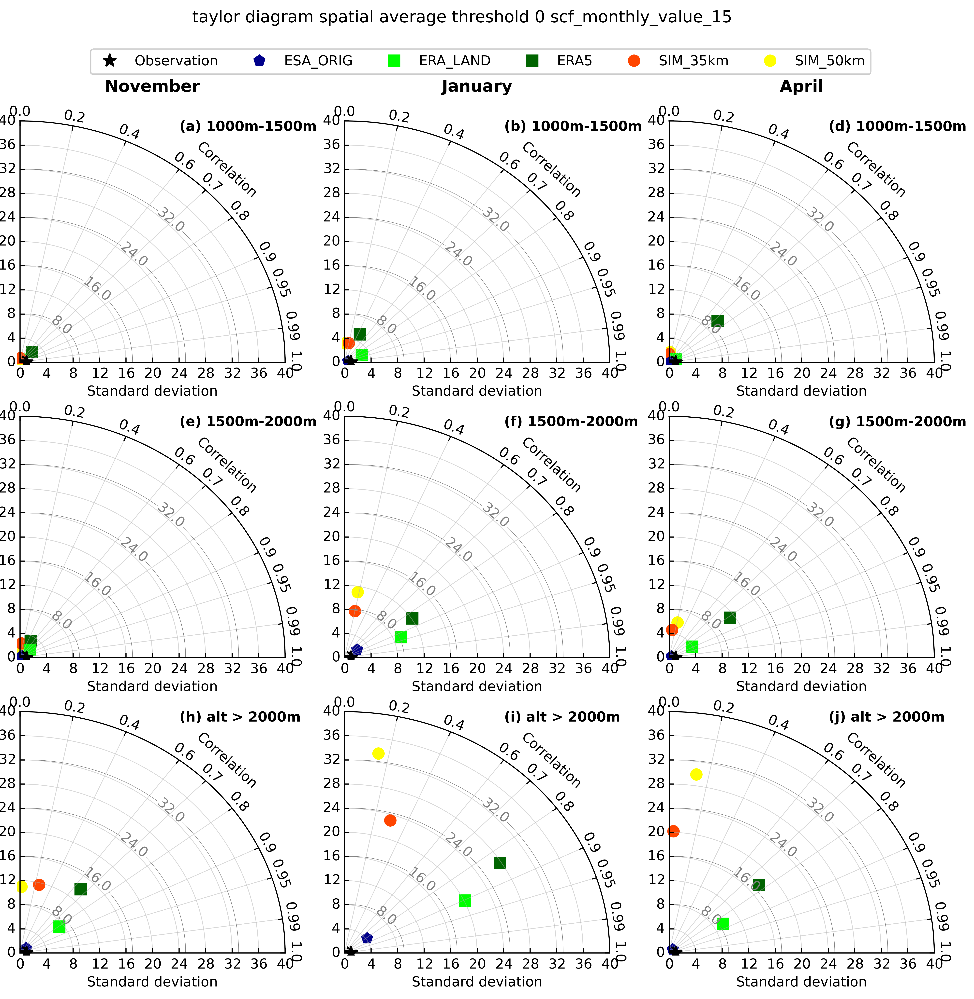

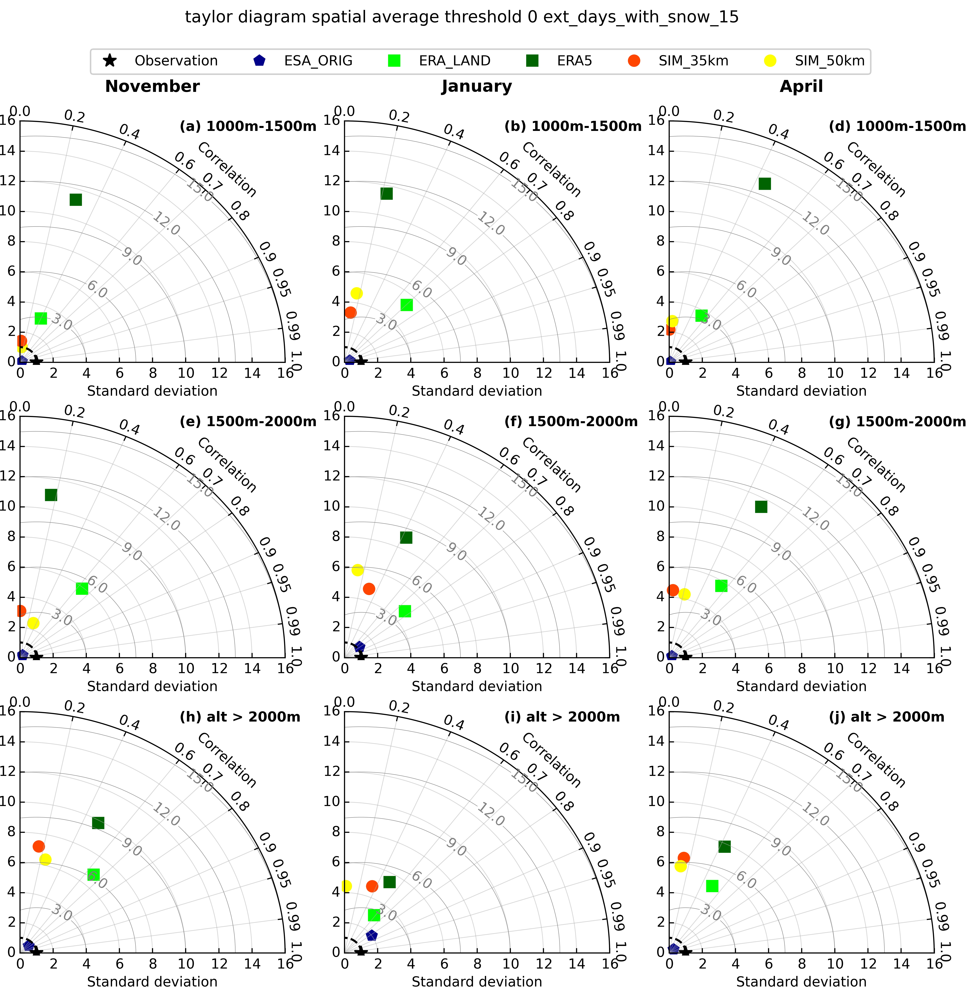

In [9]:
list_var = ['scf', 'ext']
mon_titles = ['November', 'January','April', '','','','','','']
bounds_titles = ['1000m_1500m', '', '', '1500m_2000m', '', '', 'alt > 2000m', '', '',]

rects = [221, 222]
abc = ['(a) 1000m-1500m', '(b) 1000m-1500m','(d) 1000m-1500m','(e) 1500m-2000m',
       '(f) 1500m-2000m','(g) 1500m-2000m','(h) alt > 2000m','(i) alt > 2000m','(j) alt > 2000m']
srange = [(0, 40), (0, 16)]
months_labels = ["NOV","JAN","MAR"]


for ipar,par in enumerate(parameters):
    fig = plt.figure(figsize=(12,11), dpi=600)

    # Calcul des indices sous forme de dictionnaire {var:{prod1:[std,corr], prod2:[std,corr]},...}
    corr_std_mons_dic = {bound:{mon:{prod:'data' for prod in products_labels_to_assess} for mon in months_labels} for bound in bounds } 
    
    for ibound,bound in enumerate(bounds):
        for imon,mon in enumerate([11,1,3]):
        
            #print(corr_std_par_dic)
            for iprod,prod in enumerate(products_labels):    
                std = (np.std(dic_data[bound][prod][par].dropna(dim='time').groupby('time.month')[mon].values))
                
                corr = (scipy.stats.pearsonr(dic_data[bound][prod][par].dropna(dim='time').groupby('time.month')[mon].values, dic_data[bound][ref][par].dropna(dim='time').groupby('time.month')[mon].values)) 

                corr_std_mons_dic[bound][months_labels[imon]][prod] = [std, corr[0]]
                        
                # dict_month[par][prod] = [std, np.abs(corr)]

                
    iax = 0            
    for ibound,bound in enumerate(bounds):
        for imon,mon in enumerate([11,1,3]):
            
            # stadarized std
            std_obs = corr_std_mons_dic[bound][months_labels[imon]][ref][0] / corr_std_mons_dic[bound][months_labels[imon]][ref][0]
            
            dia = TaylorDiagram(std_obs, fig=fig, rect=int('33'+str(iax+1)), label='Observation', srange=srange[ipar], extend=False)
            # dia = TaylorDiagram(std_obs[i], fig=fig, rect=rects[i], label='Observation', srange=(0, 5), extend=True)
            
            for prod in products_labels_to_assess:   
                std = corr_std_mons_dic[bound][months_labels[imon]][prod][0] / std_obs
                corr = np.abs(corr_std_mons_dic[bound][months_labels[imon]][prod][1])
                dia.add_sample(std, corr, marker=keys_dic_markers[prod], ms=8, 
                           ls='', label=prod, zorder=0, color=colors[prod])

                
            dia._ax.set_title(mon_titles[iax]+'\n', size=12, fontweight="bold")
            #if [0,3,6].count(iax):
            dia._ax.set_ylabel(bounds_titles[iax], size=12, fontweight="bold")

            dia._ax.text(0.6, 0.95, abc[iax], size=10, weight='bold', transform=dia._ax.transAxes)
    
            # Add RMS contours, and label them
            contours = dia.add_contours(levels=5, colors='0.5', linewidths=0.3)  # 5 levels in grey
            PLT.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
       
            fig.legend(dia.samplePoints,[ p.get_label() for p in dia.samplePoints ],
                       numpoints=1, bbox_to_anchor=(0.85, 0.95), ncol=6)
        
            # Grid
            dia._ax.grid(lw=0.5, alpha=0.5)
            
            iax = iax + 1    
            
            dia._ax.set_ylabel(bound, size=12, fontweight="bold")
    fig.suptitle('taylor diagram spatial average threshold '+threshold+' '+par)          
    #fig.savefig(output_path_taylor+'/taylor_dia_spatial_average_threshold_'+threshold+'_'+par+'.png')
    #fig.savefig(output_path_taylor+'/taylor_dia_spatial_average_threshold_'+threshold+'_'+par+'.pdf')